<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Deep-Learning-APIs-for-Image-Multi-Label-Classification" data-toc-modified-id="Deep-Learning-APIs-for-Image-Multi-Label-Classification-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Deep Learning APIs for Image Multi-Label Classification</a></span><ul class="toc-item"><li><span><a href="#Inception-V3" data-toc-modified-id="Inception-V3-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Inception V3</a></span></li><li><span><a href="#YOLO-V3" data-toc-modified-id="YOLO-V3-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>YOLO V3</a></span></li></ul></li><li><span><a href="#Labeling-the-data" data-toc-modified-id="Labeling-the-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Labeling the data</a></span><ul class="toc-item"><li><span><a href="#Inception" data-toc-modified-id="Inception-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Inception</a></span></li><li><span><a href="#YOLO" data-toc-modified-id="YOLO-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>YOLO</a></span></li></ul></li><li><span><a href="#Find-similar-images" data-toc-modified-id="Find-similar-images-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Find similar images</a></span><ul class="toc-item"><li><span><a href="#Inception" data-toc-modified-id="Inception-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Inception</a></span></li><li><span><a href="#Neo4j" data-toc-modified-id="Neo4j-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Neo4j</a></span></li></ul></li></ul></div>

# Computer Vision - Image Similarity Problem

In [1]:
# Models
from models.inception_v3 import Inception_V3
from models.openai_clip import OpenAI_clip
from models import yolov3, neo4j_queries, config

# Libraries
import numpy as np
import pandas as pd
import os
from IPython.display import Image as Image_display
from IPython.display import display
from tqdm import tqdm
import json

In [2]:
# Memory Growth
try:
    import tensorflow as tf
    tf_gpus = tf.config.list_physical_devices('GPU')
    for gpu in tf_gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
except:
    print("Memory was not set.")

In [3]:
# Read Access keys from file
ACCESS_ID = config.ACCESS_ID
ACCESS_KEY = config.ACCESS_KEY

In [4]:
# Get file names from S3
file_names = Inception_V3.get_file_names(ACCESS_ID, ACCESS_KEY)

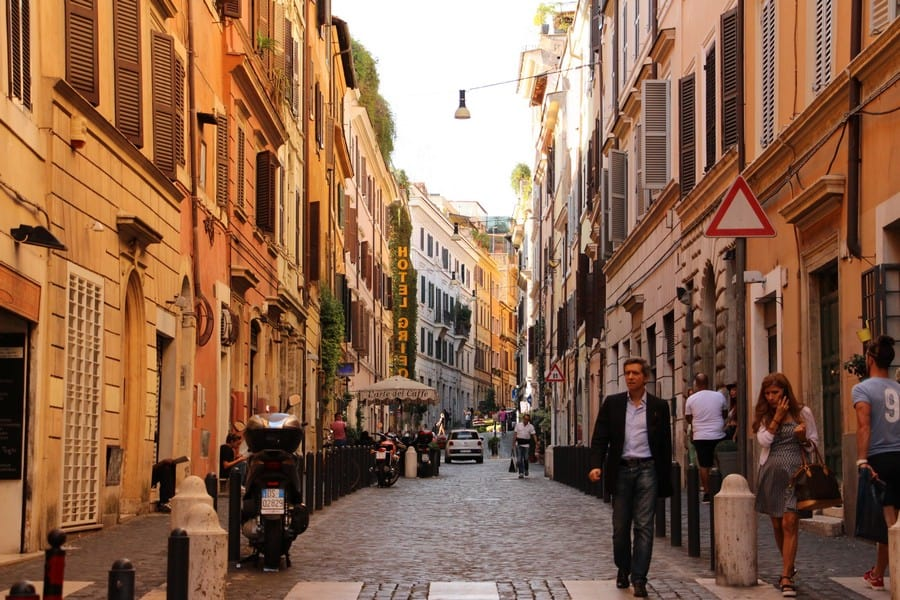

In [5]:
# Load a Sample Image
img_name = file_names[8]
img = Inception_V3.read_image(img_name, ACCESS_ID, ACCESS_KEY)
img

##  Deep Learning APIs for Image Multi-Label Classification

### Inception V3

In [6]:
os.listdir("labels")

['imagenet_1000_labels.json',
 'image_labels_inception.json',
 'image_labels_yolo.json',
 'image_tensors.pkl']

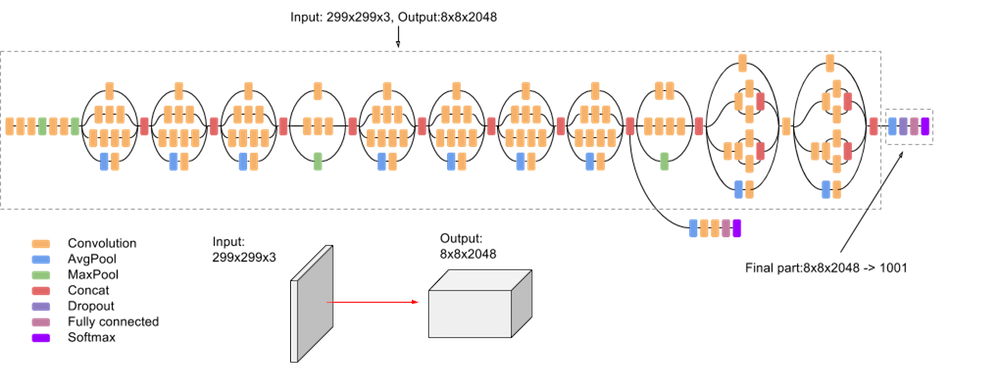

In [7]:
# OpenAI Diagram
display(Image_display(os.path.join("images","INCEPTION.png")))

In [8]:
# Define model
inception_model = Inception_V3(ACCESS_ID, ACCESS_KEY)

In [9]:
# Predicted labels
inception_model.predict_classes(img_name, print_results=False)

{'Altar',
 'Ashcan',
 'Barrow',
 'Bell Cote',
 'Bookshop',
 'Cab',
 'Church',
 'Gondola',
 'Moving Van',
 'Police Van',
 'Street Sign',
 'Streetcar',
 'Triumphal Arch',
 'Trolleybus',
 'Vault'}

### YOLO V3

In [10]:
# Define YOLO model
yolo = yolov3.YoloV3()
yolov3.load_darknet_weights(yolo, 'models/yolov3.weights')

KerasTensor(type_spec=TensorSpec(shape=(None, None, None, 3, 85), dtype=tf.float32, name=None), name='yolo_output_2/lambda_2/Reshape:0', description="created by layer 'yolo_output_2'")


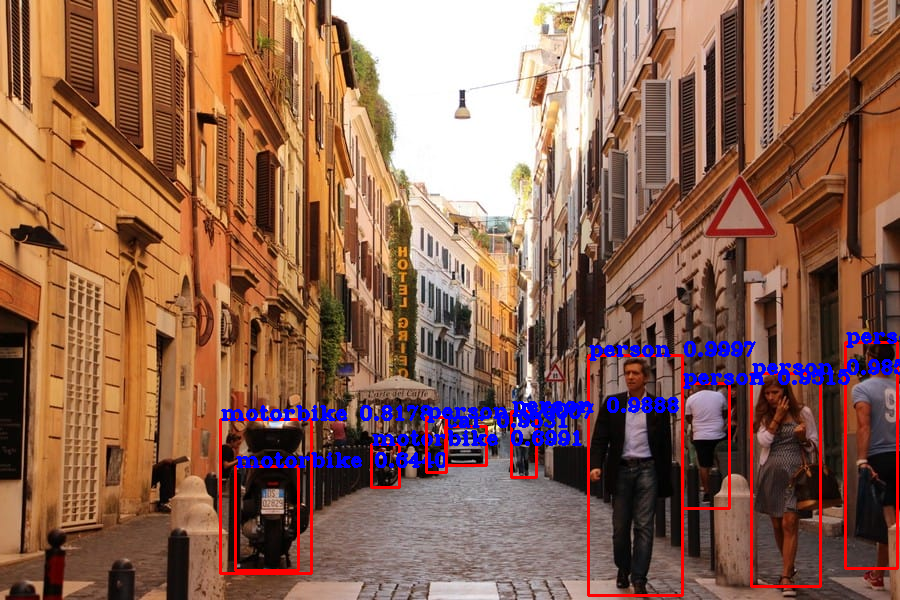

{'car', 'motorbike', 'person'}

In [11]:
# Predicted labels
yolov3.predict_classes(img_name, yolo, ACCESS_ID, ACCESS_KEY, print_image=True)

## Labeling the data

### Inception

In [ ]:
# Image labels
image_labels = {}
for img in tqdm(file_names):
    image_labels[img] = list(inception_model.predict_classes(img, top=15, print_results=False))

In [ ]:
# Save labels as json
with open('labels/image_labels_inception.json', 'w') as fp:
    json.dump(image_labels, fp)

### YOLO

In [ ]:
# Image labels
image_labels = {}
for img in tqdm(file_names):
    image_labels[img] = list(yolov3.predict_classes(img, yolo, ACCESS_ID, ACCESS_KEY, print_image=False))

In [ ]:
# Save labels as json
with open('labels/image_labels_yolo.json', 'w') as fp:
    json.dump(image_labels, fp)

# Neo4j

In this section the data obtained from the models is written to a Neo4j database.

In [ ]:
# Load some images labels
with open('labels/image_labels_yolo.json') as f:
    labels_dicc = json.load(f)

In [ ]:
# Delete all
neo4j_queries.delete_all()

In [ ]:
# Nodes and labels
urls = list(labels_dicc.keys())
labels = list(labels_dicc.values())

# Create nodes and relations
neo4j_queries.create_nodes(urls, labels)

## Find similar images

### Inception

100%|███████████████████████████████████████████████████████████████████████████████| 901/901 [00:05<00:00, 158.80it/s]

New Image:


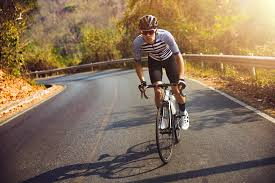

Similar Images
Dissimilarity Score: 0.32


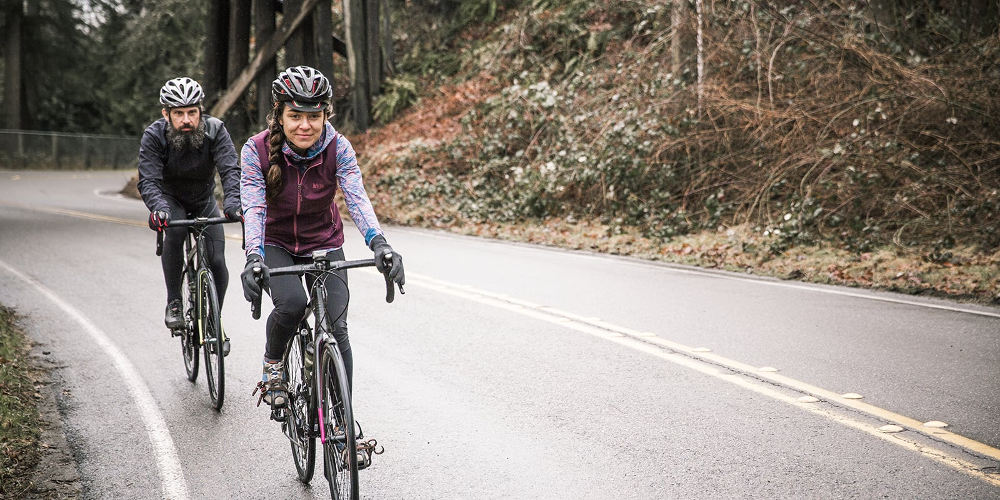

Dissimilarity Score: 0.42


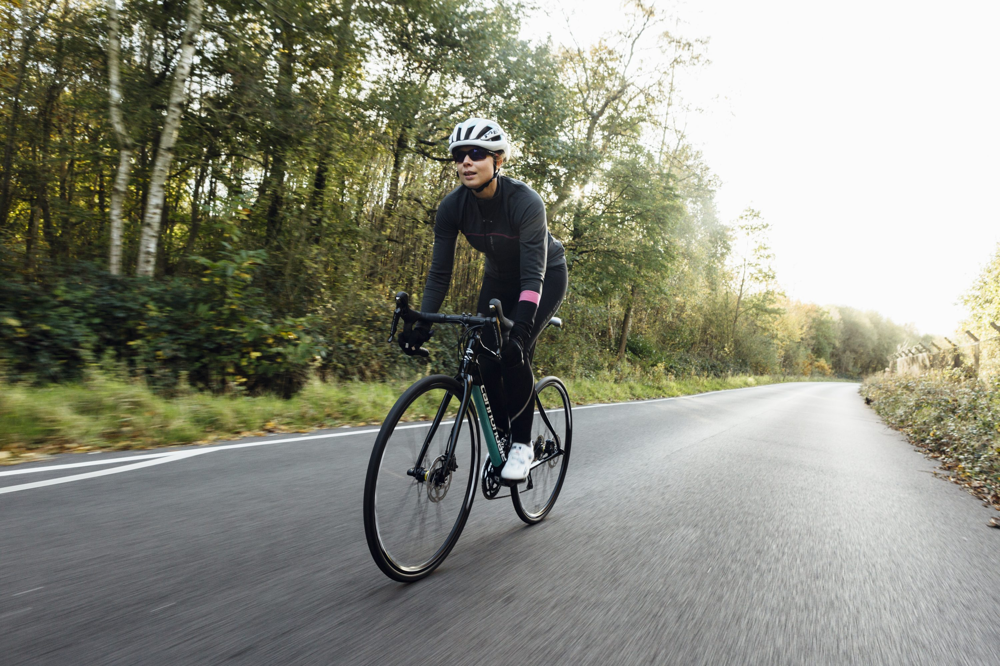

Dissimilarity Score: 0.45


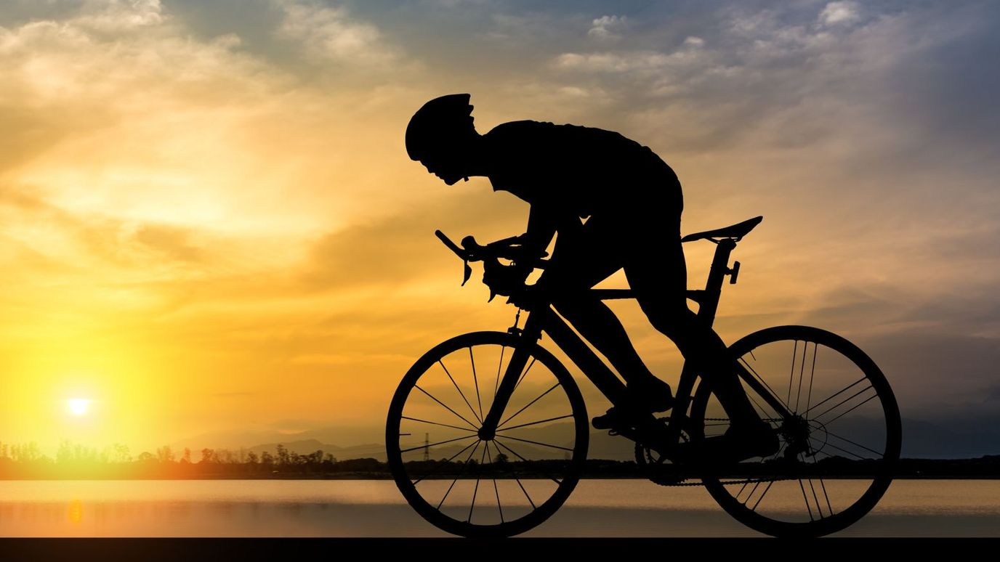

In [23]:
# Find Similar images with Inception (#21 minutes without cache)
images = inception_model.find_similar_images_dl("test_image.jpg", metric='cosine')

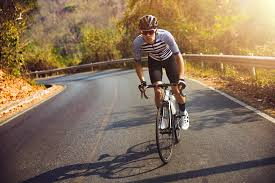

In [19]:
from PIL import Image
img = Image.open("images/test_image.jpg")
img

In [24]:
similar_images = inception_model.find_similar_images_dl_img(img, metric='cosine', top_k = 15)
links = ["https://carlo-computer-vision-project.s3.amazonaws.com/" + f for f in similar_images]
links

100%|███████████████████████████████████████████████████████████████████████████████| 901/901 [00:06<00:00, 143.03it/s]


['https://carlo-computer-vision-project.s3.amazonaws.com/012.jpg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/011.jpg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_8.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_10.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_1.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_11.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_4.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_3.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_2.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_5.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/stop sign_12.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/bicycle_12.jpeg',
 'https://carlo-computer-vision-project.s3.amazonaws.com/stop sign_6.jpeg',
 'https://carlo-computer-vision-project.s3.a

### Neo4j

In [ ]:
# Find Similar Images from a given local path (metric can be jaccard or overlap)
file_path = "images/test_image.jpg"
new_labels = yolov3.predict_classes(file_path, yolo, ACCESS_ID, ACCESS_KEY, print_image=False, from_local_file=True)
neo4j_queries.find_similar_images_neo4j(file_path, ACCESS_ID, ACCESS_KEY, new_labels, metric="jaccard")

Carlo di Francescantonio Torrado  -  2021